# Broadband colour analysis

Objective: to search the broadband magnitudes for any indication which might help a rough cut between low-redshift and high-redshift galaxies. 

Bigger picture: 
Since use of the u-band is a hinderence in establishing accurate photo-z of high-z galaxies, but a great strength when working on low-z populations, it would be ideal to have a general cut to make based purely on observational data (pre-processed) to determine whether, for each object, the u-band should be considered or not.

Thoughts:
 - Wouldn't it be awesome to have this as a function over redshift, rather than a boolean flag?
 - I wonder if it would be better to apply some dimensionality reduction to the broadband magnitudes in order to more clearly classify or cluster galaxies of similar colour profiles. Using ML techniques like UMAP, t-SNE and SOM have proven quite good at grouping galaxies of similar z (see Caltech work).
 - Would a regressional treatment be better? Since to establish a function of redshift rather than a generic colourspace may be more suitable in creating the 'redshift function' I described earlier? Random training sample, then a continuation of the line produced. Maybe using the already reduced colour continuum created by UMAP?

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import pandas as pd
import seaborn as sns 

In [2]:
sns.set(style='whitegrid', context='talk', palette='Set1', rc={'figure.figsize':(14,10)})
plt.rcParams['figure.dpi'] = 300

In [3]:
fig_prefix = 'bband_col_analysis_figs/20-08-20-'

## Importing model galaxy data and observed-frame mags

In [4]:
#bbands = model_df.columns[4:14:1]
bbands = ['ind', 'LSST_u', 'LSST_g', 'LSST_r', 'LSST_i', 'LSST_z', 'VIS', 'NISP_Y', 'NISP_J', 'NISP_H']

In [5]:
model_df = pd.read_csv('subset_4051.csv', index_col=0, header=0)
observed_mags_df = pd.read_csv('ugrizVISYJH4051.cat', delimiter='\s+', index_col=0, usecols=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], names=bbands)

model_df.head()

,z,t/Gyr,M*,VIS,NISP_Y,NISP_J,NISP_H,LSST_u,LSST_g,LSST_r,...,2MASS_Ks,wircam_Ks,M_initial,Z,SFH,tau/Gyr,Av_law,Av,t_l,physical
925475,5.36,0.01,0.9128,27.2677,25.8091,25.3337,24.9579,32.8884,31.2726,28.3088,...,24.6984,24.7020,1.000000e+10,0.3,1.0,0.1,1.0,0.8,12.700636,True
86139,1.96,0.80,0.6776,29.6252,27.8035,26.5675,25.6417,32.2674,30.9611,30.0527,...,24.9591,24.9713,1.000000e+10,0.0,1.0,3.0,1.0,1.0,10.427619,True
340793,0.26,7.00,0.5464,27.9727,24.7910,23.4551,22.3137,37.2184,32.9626,29.7347,...,21.5998,21.6078,1.000000e+10,0.0,1.0,1.0,1.0,1.6,3.126385,True
967092,0.83,0.10,0.7879,19.7992,19.8492,19.8144,19.5259,19.5824,19.7150,19.8901,...,19.4702,19.4699,1.000000e+10,0.3,1.0,1.0,0.0,0.0,7.158495,True
1447538,3.30,0.06,0.8168,38.7796,35.4560,33.7999,31.5068,51.5970,43.8688,40.4406,...,30.0605,30.0766,1.000000e+10,0.3,1.0,3.0,1.0,1.6,11.846391,True


In [6]:
observed_mags_df['foreign_index'] = model_df.index

In [7]:
model_df['z'].values

array([5.36, 1.96, 0.26, ..., 0.09, 3.35, 0.91])

In [8]:
observed_mags_df['spec_z'] = model_df['z'].values

In [9]:
observed_mags_df.head()

,LSST_u,LSST_g,LSST_r,LSST_i,LSST_z,VIS,NISP_Y,NISP_J,NISP_H,foreign_index,spec_z
ind,,,,,,,,,,,
1,33.0471,30.9808,28.4506,27.0696,26.2480,27.1543,25.7530,25.3293,25.0151,925475,5.36
2,31.9058,31.0543,29.8643,29.3825,29.1474,29.7088,27.7050,26.4194,25.9915,86139,1.96
3,36.9525,32.7385,29.8778,27.9589,26.5433,28.0982,24.7335,23.4949,22.7324,340793,0.26
4,19.5135,19.4786,19.9464,19.5692,19.6658,19.9663,20.0240,19.7866,19.5848,967092,0.83
5,51.2772,44.2906,40.5009,38.4682,37.5829,38.8274,35.7957,33.6588,31.7206,1447538,3.30


## Colour magnitudes

Text(0, 0.5, 'count')

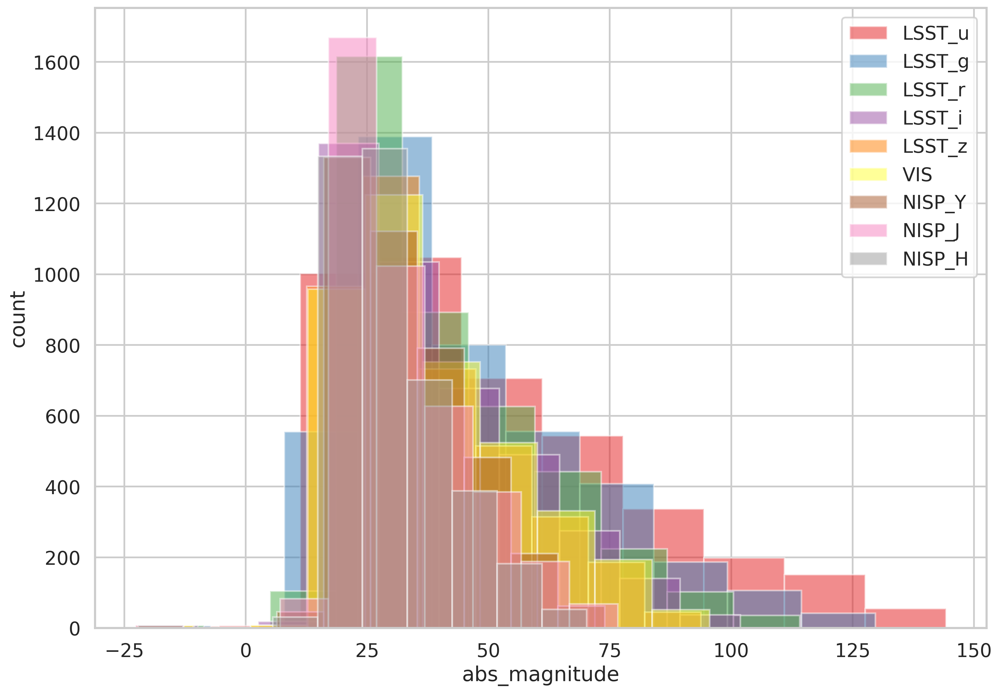

In [10]:
for band in bbands[1:]:
    plt.hist(observed_mags_df[band], alpha=0.5)
    
plt.legend(bbands[1:])
plt.xlabel('abs_magnitude')
plt.ylabel('count')

## colour matchplot(?), or 9x9 plot? colourxcolour plot?

In [11]:
observed_filt_only_df = observed_mags_df.loc[:, 'LSST_u':'NISP_H']


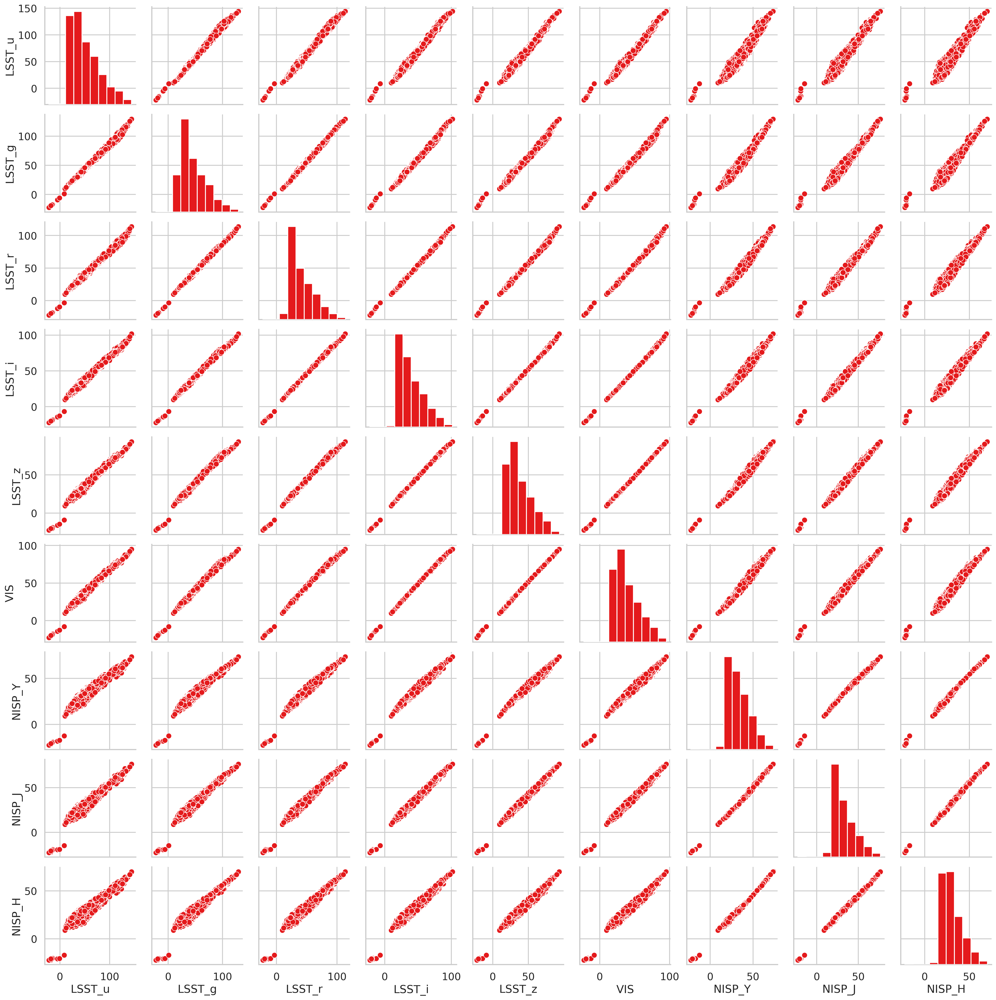

In [12]:
sns.pairplot(observed_filt_only_df)

## UMAP colour space

In [12]:
difference_bands = np.zeros(shape=(4051, 8))
for i in range(1, 9, 1):
    difference_bands[:, i-1] = observed_mags_df[bbands[i]] - observed_mags_df[bbands[i+1]]
print(difference_bands)

[[ 2.0663  2.5302  1.381  ...  1.4013  0.4237  0.3142]
 [ 0.8515  1.19    0.4818 ...  2.0038  1.2856  0.4279]
 [ 4.214   2.8607  1.9189 ...  3.3647  1.2386  0.7625]
 ...
 [ 5.2593  2.8901  2.698  ...  3.5156  1.4952  1.6743]
 [11.6737  6.8125  6.8622 ... 11.524  -0.1271  4.9877]
 [ 0.8571  0.3249  0.4396 ...  0.5349  0.7071 -0.0256]]


In [13]:
import umap

### Unsupervised 

In [14]:
bband_embed_unsup = umap.UMAP().fit_transform(difference_bands)

In [15]:
bband_embed_unsup

array([[-4.1574035,  4.5072536],
       [-2.0720236,  3.4148633],
       [-0.6365753,  8.601972 ],
       ...,
       [ 0.7256273,  9.965389 ],
       [ 8.870349 ,  9.686886 ],
       [-2.856315 ,  0.6569117]], dtype=float32)

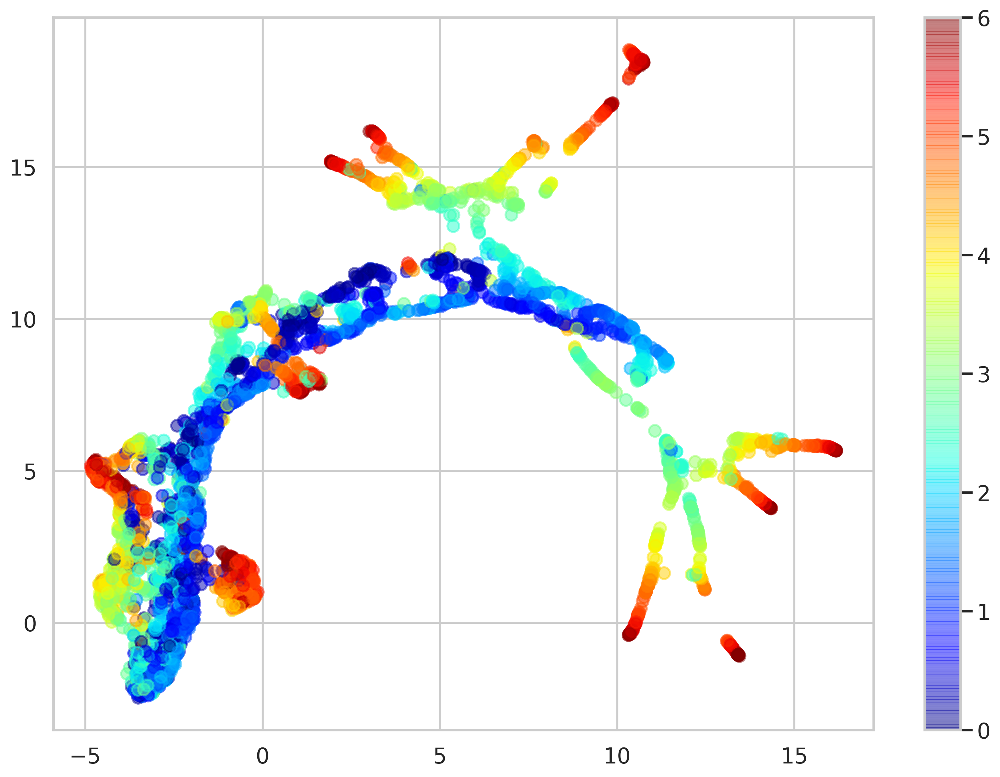

In [16]:
plt.scatter(*bband_embed_unsup.T, c=observed_mags_df['spec_z'], cmap='jet', alpha=0.5)
plt.colorbar()
#plt.savefig(fig_prefix+'unsup_bband_specz.png', dpi=300, transparent=False, format='png')

In [52]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVC

In [39]:
print(observed_mags_df['spec_z'].values.shape, difference_bands.shape)

(4051,) (4051, 8)


In [40]:
train_test_split?

In [57]:
X_train, X_test, y_train, y_test = train_test_split(difference_bands,
                                                    observed_mags_df['spec_z'].values, 
                                                    test_size=0.25,
                                                    random_state=42)

In [58]:
trans = umap.UMAP(n_neighbors=5, random_state=42).fit(X_train)

In [23]:
plt.figure(figsize=(10, 8))
plt.scatter(trans.embedding_[:, 0], trans.embedding_[:, 1], s=5, c=y_train, cmap='jet', alpha=0.5)
plt.title('Embedding of the training set by UMAP', fontsize=24)

NameError: name 'trans' is not defined

<Figure size 3000x2400 with 0 Axes>

In [60]:
%time test_embedding = trans.transform(X_test)

CPU times: user 3.18 s, sys: 6.52 ms, total: 3.18 s
Wall time: 3.18 s


Text(0.5, 1.0, 'Embeddng of the test set by UMAP')

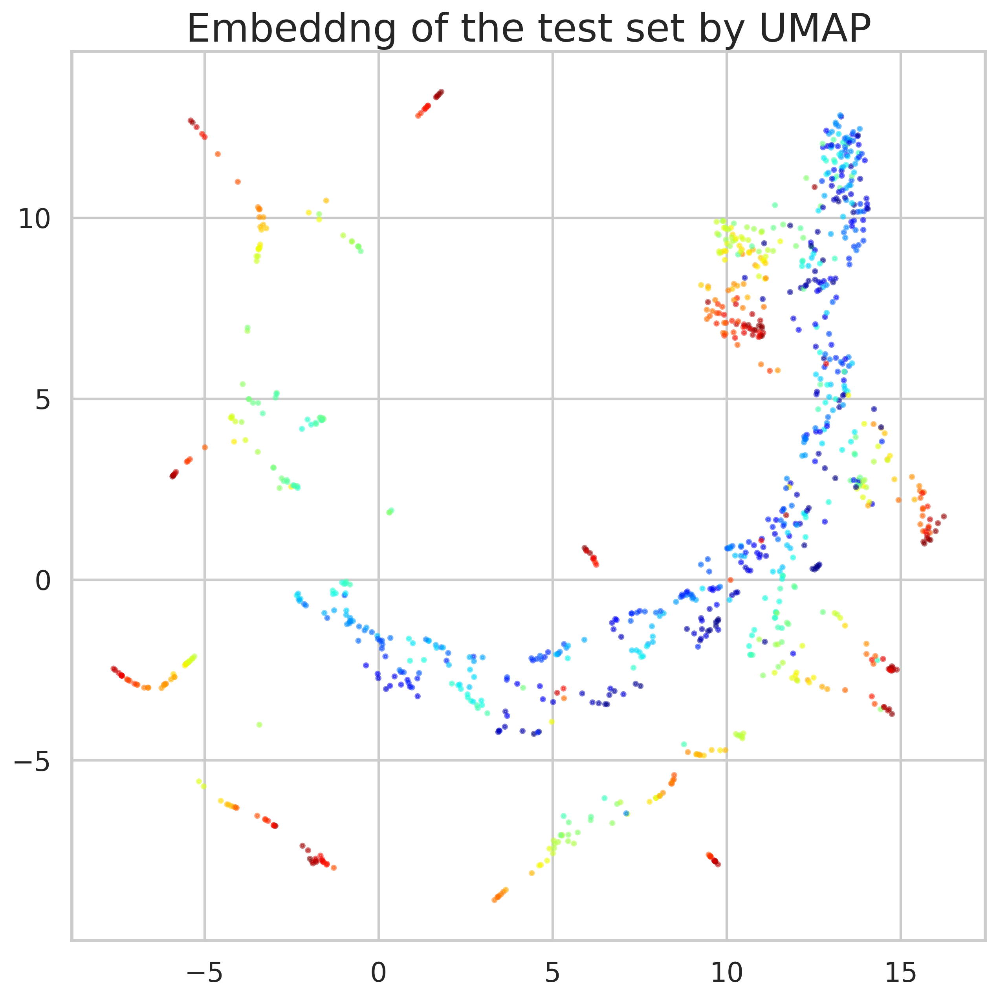

In [61]:
plt.figure(figsize=(10,10))
plt.scatter(test_embedding[:, 0], test_embedding[:, 1], s=5, c=y_test, cmap='jet', alpha=0.5)
plt.title('Embeddng of the test set by UMAP', fontsize=24)

## Regression Experiments

In [10]:
variables = observed_mags_df.columns[:9]

jet = plt.get_cmap('jet')
colours = iter(jet(np.linspace(0, 1, 9)))

def correlation(df, variables, n_rows, n_cols):
    fig = plt.figure(figsize=(20, 30))
    for i, var in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        asset = df.loc[:, var]
        ax.scatter(df['spec_z'], asset, color=next(colours), s=2)
        ax.set_xlabel ('Spec. Redshift, z')
        ax.set_ylabel("{}".format(var))
        ax.set_title(var + ' vs. colour magnitude')
    fig.tight_layout()
    plt.show()
    

correlation(observed_mags_df, variables, 5, 2)


In [11]:
observed_mags_df.corr()['spec_z'].loc[variables]

LSST_u    0.374797
LSST_g    0.393530
LSST_r    0.384426
LSST_i    0.386790
LSST_z    0.398884
VIS       0.390610
NISP_Y    0.488851
NISP_J    0.493288
NISP_H    0.543708
Name: spec_z, dtype: float64

In [12]:
from sklearn.model_selection import train_test_split, cross_val_score

In [13]:
X_tr_index, X_te_index, y_train, y_test = train_test_split(observed_mags_df.index,
                                                    observed_mags_df['spec_z'].values, 
                                                    test_size=0.25,
                                                    random_state=42)

In [16]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [17]:
X_train = observed_mags_df.iloc[X_tr_index-1, :8].values

In [18]:
X_test = observed_mags_df.iloc[X_te_index-1, :8].values

In [61]:
print(X_test.shape, y_test.shape)

(1013, 8) (1013,)


In [20]:
lr.fit(X_train, y_train)

LinearRegression()

In [21]:
z_predictions = lr.predict(X_test)

In [22]:
mae = sum(abs(z_predictions - y_test)) / y_test.shape[0]

In [23]:
err = (z_predictions - y_test)

In [42]:
del_z_metric = (err)/(y_test+1)

In [37]:
sig_z_metric = abs(err)/(y_test+1)

In [24]:
print(mae)

0.7521720324901643


Text(0.5, 0, 'pred_z')

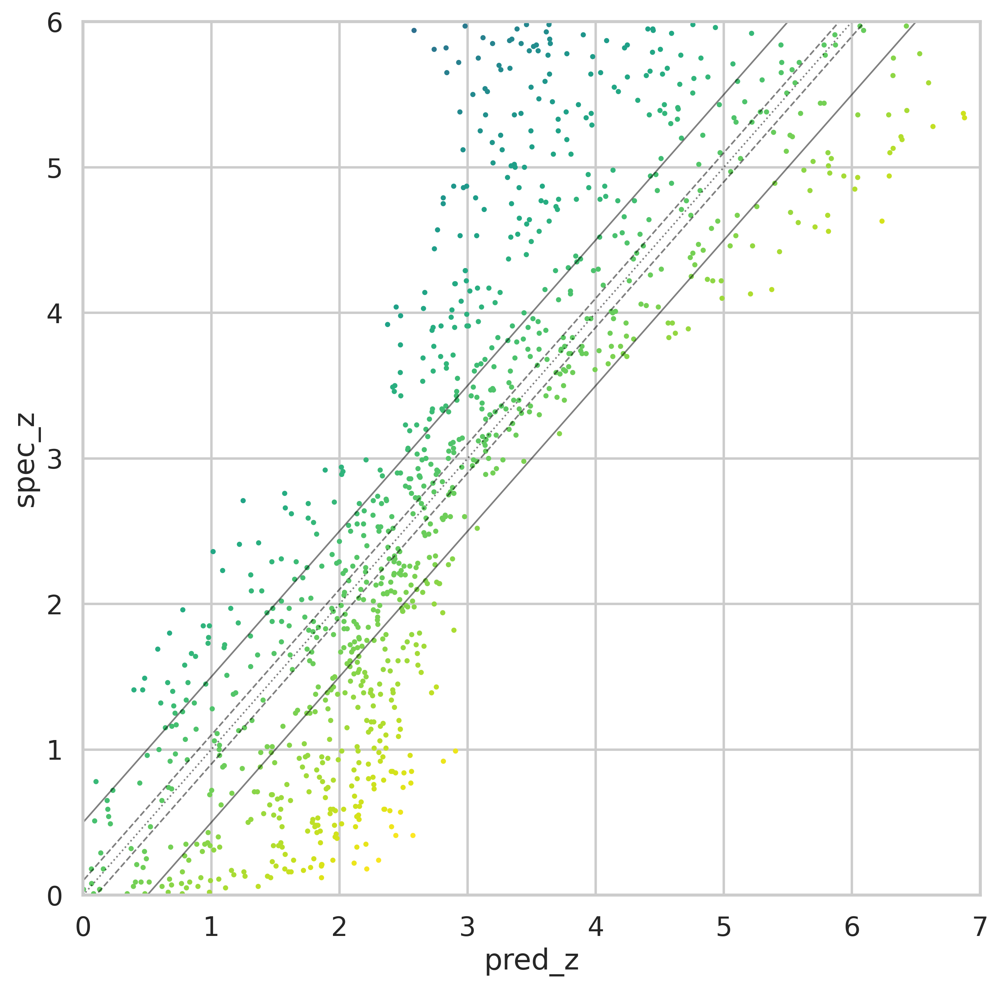

In [25]:
plt.figure(figsize=(10,10))
plt.scatter(z_predictions, y_test, s=3, c=err, cmap='viridis')

plt.plot([-6., 9.5], [-5.5, 10.],'k', alpha=0.5, lw=1)
plt.plot([-6., 9.9], [-5.9, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.], [-6, 10.], ':k', alpha=0.5, ls=':', lw=1)
plt.plot([-6., 10.1], [-6.1, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.5], [-6.5, 10.],'k', alpha=0.5, lw=1)
plt.xlim(0, 7)
plt.ylim(0, 6)
plt.ylabel('spec_z')
plt.xlabel('pred_z')

In [26]:
from statistics import stdev 

Text(0.5, 0, '(z_predction - z_spec) / (z_spec + 1)')

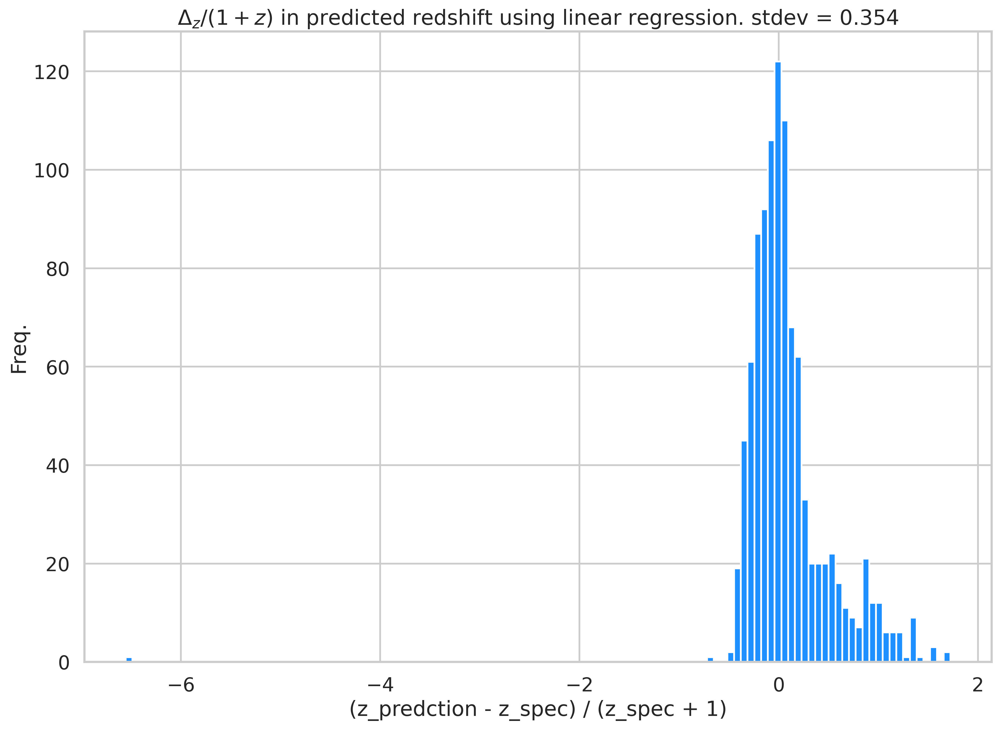

In [44]:
plt.hist(del_z_metric, bins='fd', color='dodgerblue')
plt.title((r'$\Delta_{z}/(1 + z)$ in predicted redshift using linear regression. stdev = %.3f' % stdev(sig_z_metric)))
plt.ylabel('Freq.')
plt.xlabel('(z_predction - z_spec) / (z_spec + 1)')

This is cool, but not really what we're looking for. Make note of this and its success and then move on.

What we really need is an unsupervised classification into two classes: `low_redshift` and `high_redshift`. This would provide us with the prior we need in order to more effectively select bands to consider in Hyperz.

In [50]:
print(r'$\sigma_{z} / (1 + z) < 0.05$ for ',len(np.argwhere(sig_z_metric < 0.05))/len(sig_z_metric))

$\sigma_{z} / (1 + z) < 0.05$ for  0.1717670286278381


## SVM regression (alteranative to linear)

In [51]:
from sklearn import svm
regr = svm.SVR()
regr.fit(X_train, y_train)

SVR()

In [53]:
svm_z_pred = regr.predict(X_test)

In [55]:
err_svm = svm_z_pred - y_test

In [57]:
svm_del_z_metric = (err_svm)/(y_test+1)

In [58]:
svm_sig_z_metric = abs(err_svm)/(y_test+1)

Text(0.5, 0, 'pred_z')

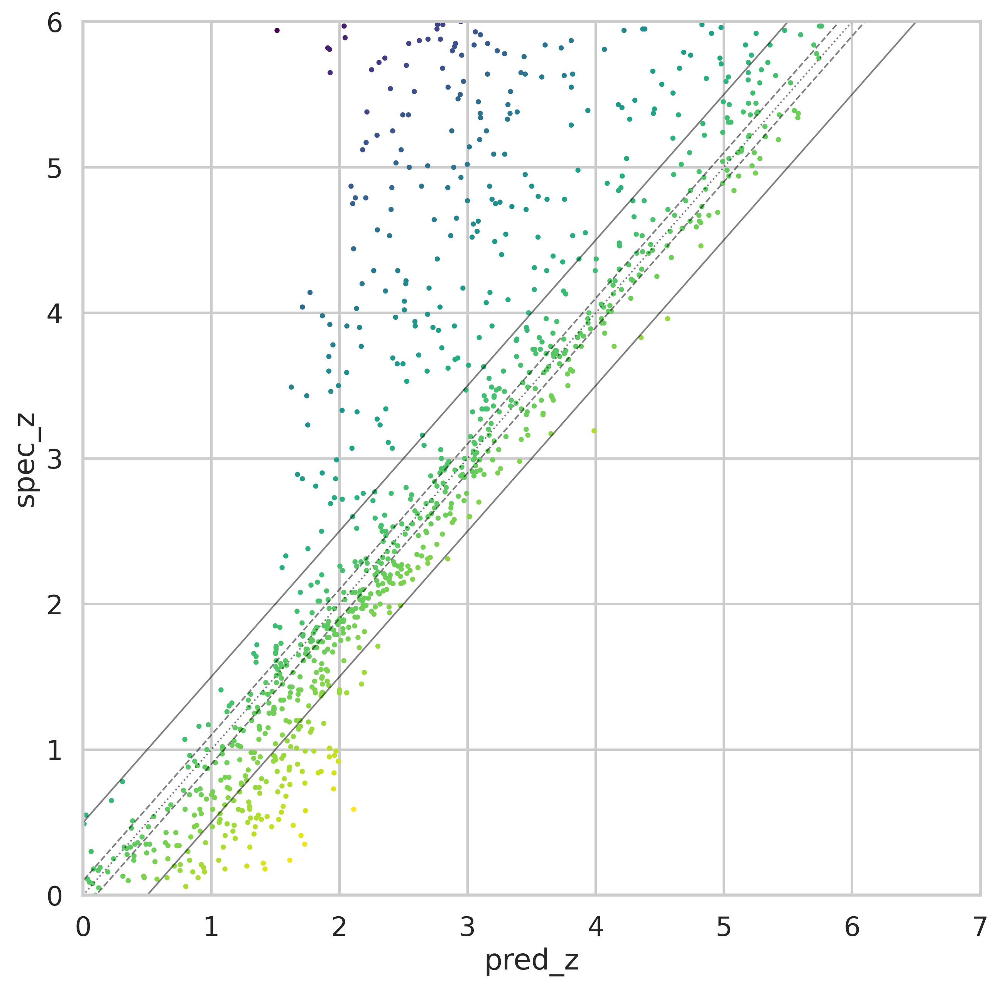

In [56]:
plt.figure(figsize=(10,10))
plt.scatter(svm_z_pred, y_test, s=3, c=err_svm, cmap='viridis')

plt.plot([-6., 9.5], [-5.5, 10.],'k', alpha=0.5, lw=1)
plt.plot([-6., 9.9], [-5.9, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.], [-6, 10.], ':k', alpha=0.5, ls=':', lw=1)
plt.plot([-6., 10.1], [-6.1, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.5], [-6.5, 10.],'k', alpha=0.5, lw=1)
plt.xlim(0, 7)
plt.ylim(0, 6)
plt.ylabel('spec_z')
plt.xlabel('pred_z')

Text(0.5, 0, '(z_predction - z_spec) / (z_spec + 1)')

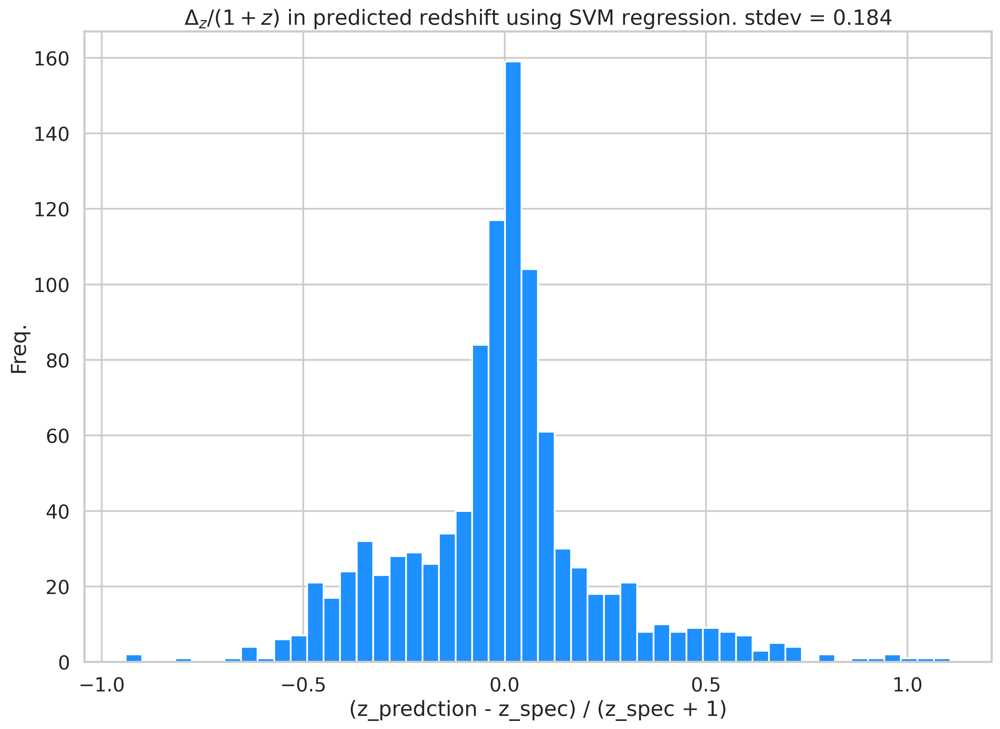

In [59]:
plt.hist(svm_del_z_metric, bins='fd', color='dodgerblue')
plt.title((r'$\Delta_{z}/(1 + z)$ in predicted redshift using SVM regression. stdev = %.3f' % stdev(svm_sig_z_metric)))
plt.ylabel('Freq.')
plt.xlabel('(z_predction - z_spec) / (z_spec + 1)')

In [63]:
len(np.argwhere(svm_sig_z_metric < 0.05))/len(svm_sig_z_metric)

0.32675222112537017

$\sigma_{z} / (1 + z)$ < 0.05 for 32.68\% of 1013 subset.

## Unsupervised two-class classification task